## NavINST API
> Version: 1.0.0

This is an example notebook to show some of the early functionalities of the NavINST API. 

### Other Python packages and configurations

In [1]:
import numpy as np
import matplotlib.pyplot as plt

The user can control the size of all plots by setting:

In [2]:
plt.rcParams['figure.dpi'] = 150

### Package import
It is possible to import just some packages

In [3]:
# import navinst.utils.data.dataloader as dl

or the entire API

In [4]:
import navinst as nv

The API works with some pre-defined standards for the input data. Please, refer to the documentation for more information. Let's load some data and see some of the functions within the classes.

### Data loaders

#### Map
Let's load a 2D map from a `txt` file:

In [5]:
map2d = nv.MapDataLoader('/Users/paulo/Documents/example/map2d.txt')

The `MapDataLoader` has a built-in function to plot the map:

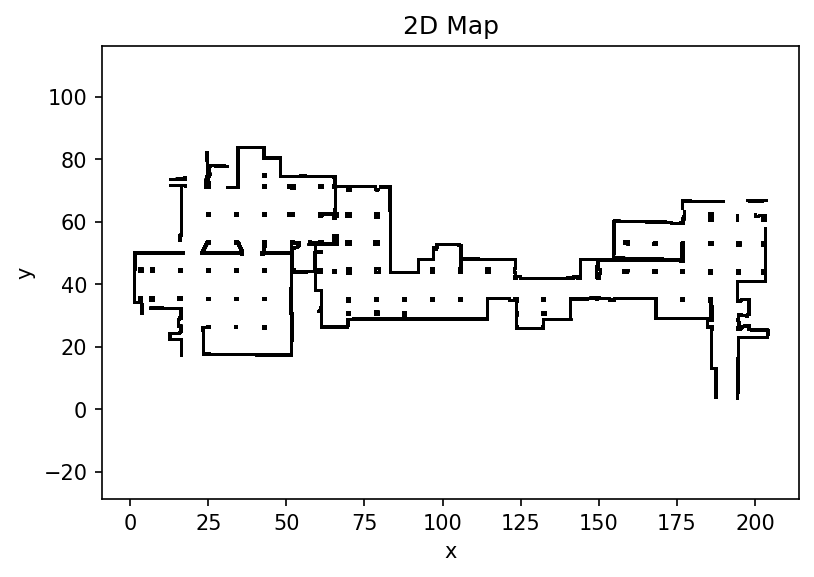

In [6]:
map2d.plot_map()

#### Odometer
Let's load some odometer measurements from a `csv` file:

In [7]:
odom = nv.OdometerDataLoader('/Users/paulo/Documents/example/odometer.csv')

With the `OdometerDataLoader` we can easily access the maximum speed of the trajectory with the function `max_speed()`.

In [8]:
print(f'{odom.max_speed()}m/s')

4.759125233m/s


The user can evaluate the speed of the vehicle with the function `plot_speed()`.

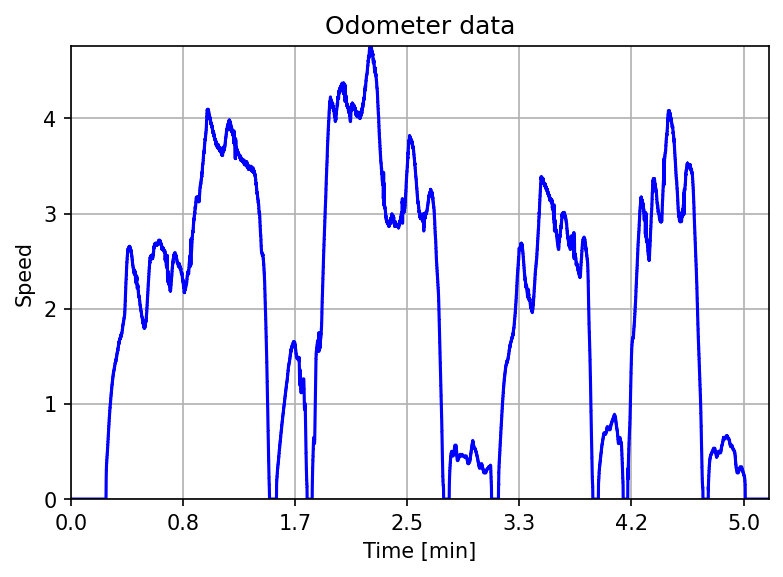

In [9]:
odom.plot_speed()

All data loaders have the function `info()` that returns important information of the class.

In [10]:
odom.info()

OdometerDataLoader
	Samples: 31120
	Unique timestamps: 31120
	Data rate [Hz]: 99.79052039632434
	First timestamp [s]: 3131.8318050000003
	Last timestamp [s]: 3443.675053
	Recorded time [s]: 311.8432479999997



#### IMU
Let's load some imu measurements and check some important information.

In [11]:
imu = nv.IMUDataLoader('/Users/paulo/Documents/example/imu.csv')

In [12]:
imu.info()

IMUDataLoader
	Samples: 3011
	Unique timestamps: 3011
	Data rate [Hz]: 9.653620340789985
	First timestamp [s]: 3131.853105
	Last timestamp [s]: 3443.6532270000002
	Recorded time [s]: 311.8001220000001



With the `IMUDataLoader` class we can easily plot the measurements of the accelerometers (`plot_fs()`) and gyroscopes (`plot_ws()`).

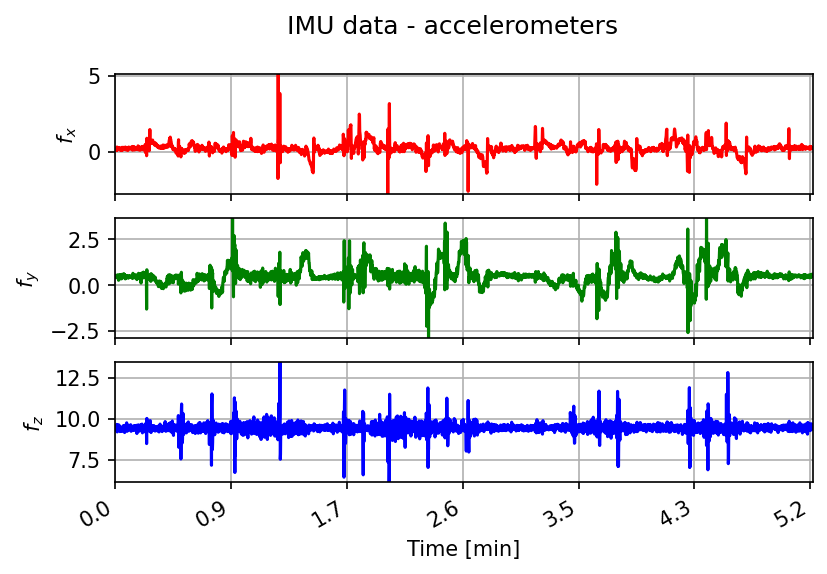

In [13]:
imu.plot_fs()

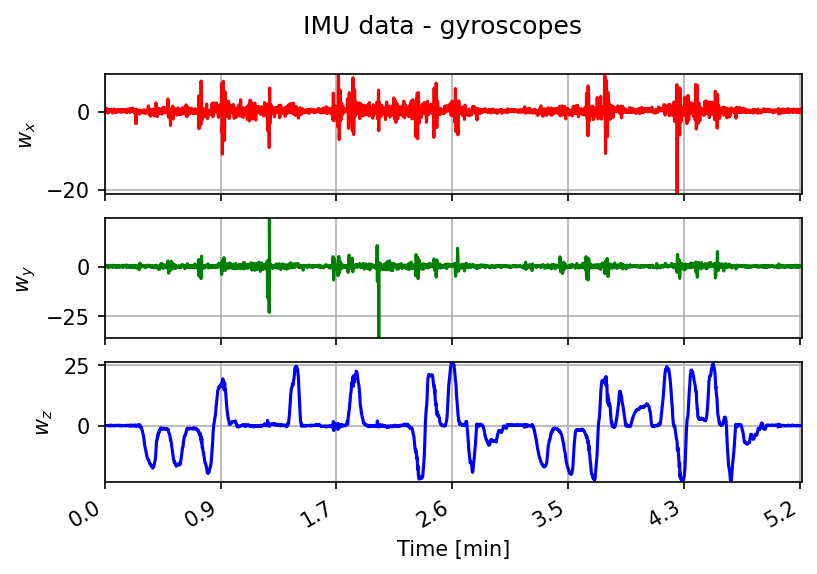

In [14]:
imu.plot_ws()

#### Reference
Let's load the reference measurements.

In [15]:
ref = nv.RefDataLoader('/Users/paulo/Documents/example/ref.csv')

In [16]:
ref.info()

RefDataLoader
	Samples: 6234
	Unique timestamps: 6234
	Data rate [Hz]: 20.000000000000025
	First timestamp [s]: 3131.9120000000003
	Last timestamp [s]: 3443.562
	Recorded time [s]: 311.64999999999964



We can plot the trajectory using the function `plot_trajectory()`.

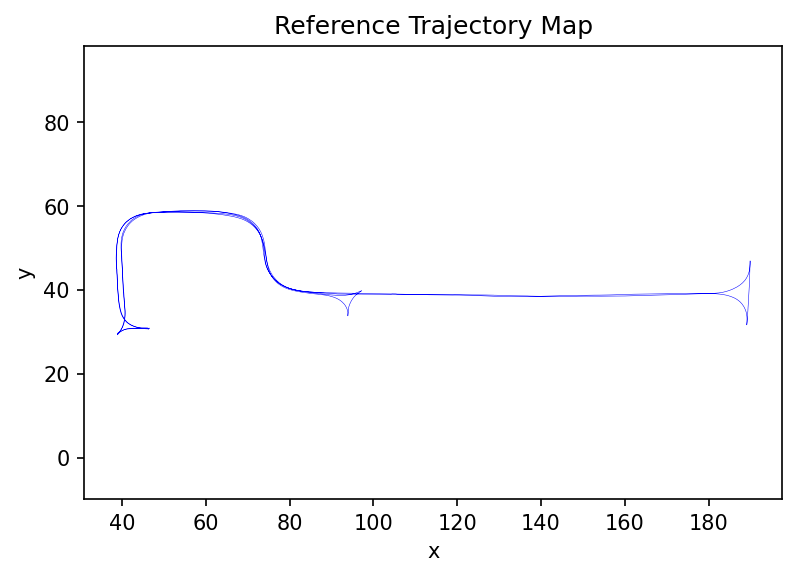

In [17]:
ref.plot_trajectory()

In addition, the user can pass a `MapDataLoader` to the function to plot the reference inside the map.

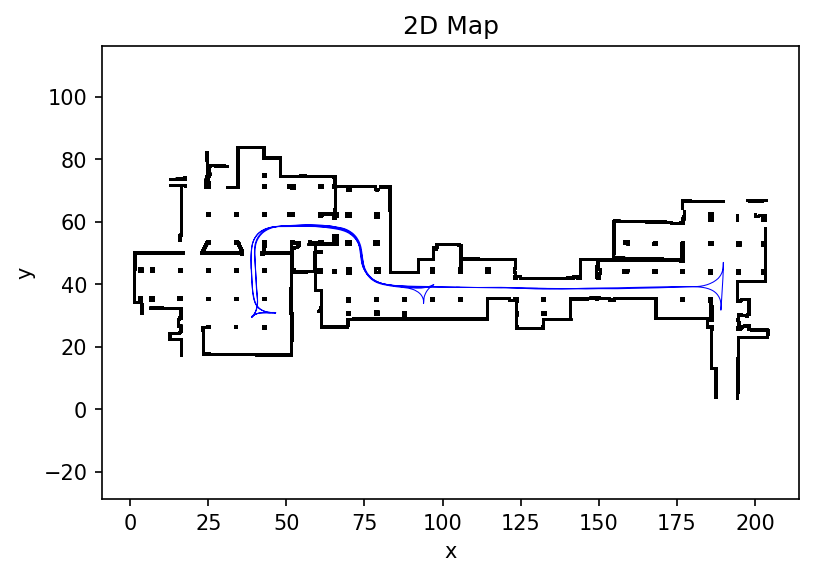

In [18]:
ref.plot_trajectory(map_loader=map2d)

#### Radar
Let's load some radar measurements. It is important to highlight that the API performs all the position transformations. Thus, it relies on some standards. For example: in terms of orientation of the radars with respect to the vehicle frame and the orientation of the objects with respect to the radar frame, the API expects to receive the *azimuth* (the angle from the frame to the body).

In this demo, we have the *yaw* angles to describe the position of the radars with respect to the vehicle frame. Thus, let's calculate the *azimuth*:

In [19]:
fr = 360 - (-43.8)
fr = fr % 360
fr = (fr + 360) % 360

fl = 360 - 44.8
fl = fl % 360
fl = (fl + 360) % 360

rr = 360 - (-127.5)
rr = rr % 360
rr = (rr + 360) % 360

rl = 360 - 134.7
rl = rl % 360
rl = (rl + 360) % 360

We configure as many radars as we want with a dictionary containing the `code` of the radar and an ordered list containing the *azimuth*, *x*, *y*, *z* coordinates. Important note: the `code` should be the same used with the template. Please, check the documentation for further details.

In [20]:
radar_offset = {1: [np.deg2rad(fr), 3.437, 0.714, 0.749],
                2: [np.deg2rad(fl), 3.437, -0.679, 0.749],
                3: [np.deg2rad(rr), -0.718, 0.775, 0.775],
                4: [np.deg2rad(rl), -0.778, -0.781, 0.779]}

Now, we can load the radar measurements:

In [21]:
radar = nv.RadarDataLoader('/Users/paulo/Documents/example/radar.csv', radar_offset=radar_offset)

In [22]:
radar.info()

RadarDataLoader
	Samples: 452141
	Unique timestamps: 6239
	Data rate [Hz]: 19.999999999999993
	First timestamp [s]: 3131.812
	Last timestamp [s]: 3443.712
	Recorded time [s]: 311.9000000000001



### Data synchronization
Data synchronization is key to navigation applications. The API has the `Synchronizer` class to help the user with this task. The user can synchronize one instance of the loaders presented in a single `Synchronizer` by defining a dictionary like this:

In [23]:
loaders = {'reference': ref,
           'radar': radar}

Now, we can the `Synchronizer` to synchronize the reference and the radar measurements.

In [24]:
sync = nv.Synchronizer(loaders=loaders, radar_offset=radar_offset)

In some application, the user can define a *buffer* to hold the latest i-th radars' measurements:

In [25]:
sync = nv.Synchronizer(loaders=loaders, radar_offset=radar_offset, radar_buffer_size=10)

In [26]:
sync.info()

Synchronization reference:
	RadarDataLoader => 19.999999999999993 Hz
RefDataLoader
	Initial timestamp (id): 3131.9120000000003 (0)
	Final timestamp (id): 3443.562 (6233)
	Number of entries: 6233
	Data rate [Hz]: 20.000000000000025
RadarDataLoader
	Initial timestamp (id): 3131.9120000000003 (2)
	Final timestamp (id): 3443.562 (6235)
	Number of entries: 6233
	Data rate [Hz]: 19.999999999999993



The `Synchronizer` is a iterator and can be easily used with `for-loops`.

In [27]:
# for reading in sync:
#     pass

The user can also can for the next set of measurements using the built-in function `next()`. The `Synchronizer` returns a dictionary with the measurements of the loaders definied during the initialization of the class. Important note: the name of the loaders are preserved to help the user.

In [28]:
reading = next(sync)

In [29]:
print(f'This is the measurements of the "reference" loader:\n{reading["reference"]}')

This is the measurements of the "reference" loader:
   timestamp      x      y       yaw
0   3131.912  46.57  30.91 -3.136299


In [30]:
print(f'This is the measurements of the "radar" loader:\n{reading["radar"]}')

This is the measurements of the "radar" loader:
    timestamp  id  object_x_pos  object_y_pos
25   3131.912   3      0.225824      8.517687
26   3131.912   3     -0.231152      9.912039
27   3131.912   3     -1.223691      4.490747
28   3131.912   1     33.994217      4.954164
29   3131.912   4     -0.688385     -4.729983
30   3131.912   4     -0.555040    -19.029638
31   3131.912   4     -2.443826    -13.875465
32   3131.912   2      3.248591     -4.274066
33   3131.912   4     -3.706720     -5.495350
34   3131.912   1     12.577579      3.807915
35   3131.912   1     12.761423      4.595383
36   3131.912   3     -4.718583      5.179298
37   3131.912   1      6.756401      1.165751
38   3131.912   2     12.561355     -5.238182
39   3131.912   2     14.091890    -23.791244
40   3131.912   2      6.078635     -2.739161


If the user decides to use the object again inside the code, resetting is needed.

In [31]:
sync.reset()

The `Synchronizer` can be used with the `RefDataLoader` to plot some important information.

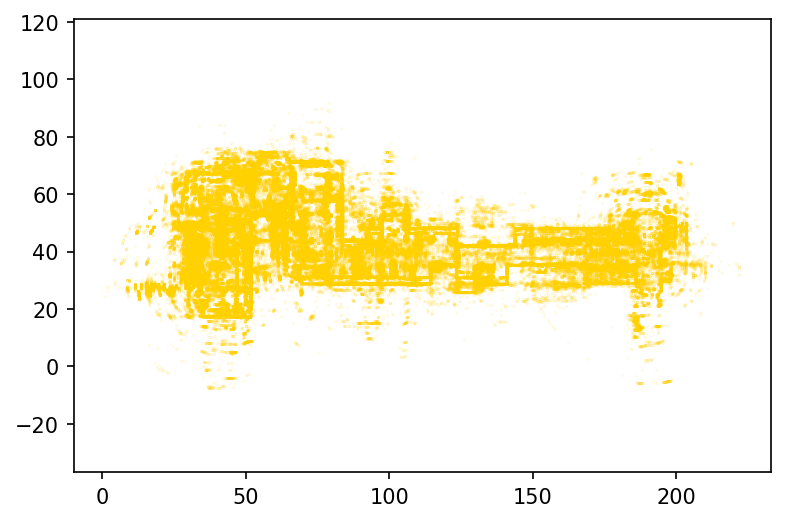

In [32]:
radar.plot_measurements(synchronizer=sync)

The user can take advantage of the `manual reset` in some cases. For example, let's plot the measurement after ignoring the the first 3000 epochs.

In [33]:
sync.reset()
for i in range(3000):
    next(sync)

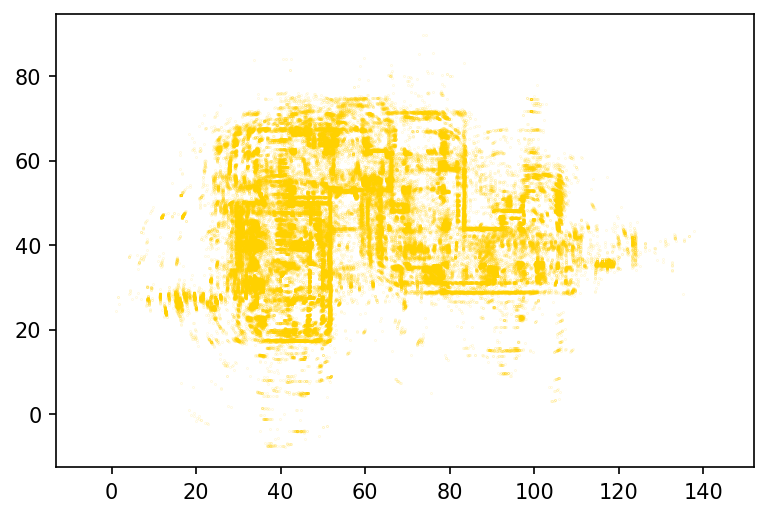

In [34]:
radar.plot_measurements(synchronizer=sync)

The user can also pass a `MapDataLoader` to the function.

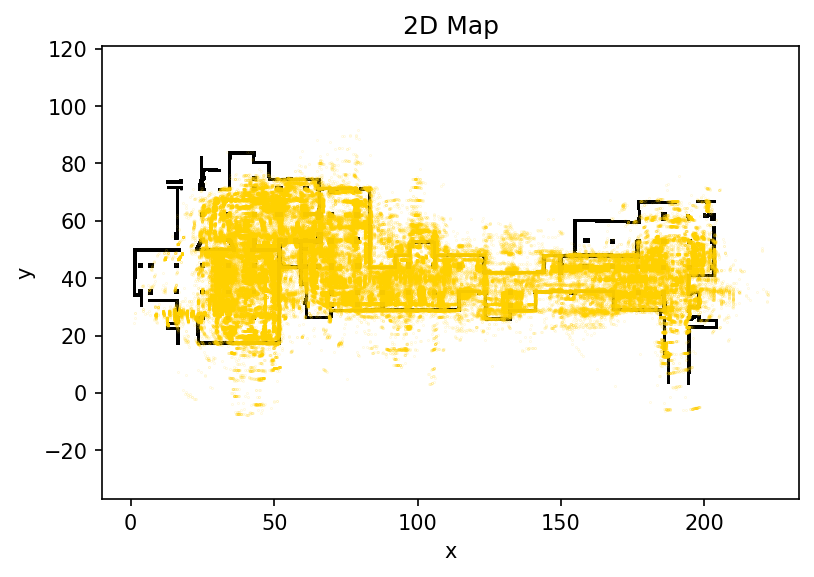

In [35]:
sync.reset()
radar.plot_measurements(synchronizer=sync, map_loader=map2d)

In addition, the user can plot the reference as well.

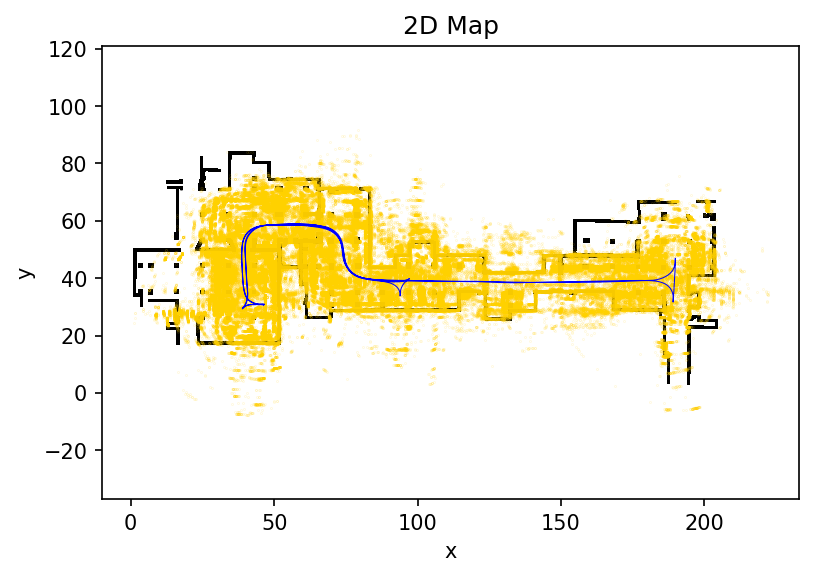

In [36]:
sync.reset()
radar.plot_measurements(synchronizer=sync, map_loader=map2d, include_ref=True)

### Animations
The API has some classes to animate trajectories. For example, the user can animate the reference trajectory to understand how the vehicle is moving. `%%capture` is only used with Jupyter Notebooks.

In [37]:
%%capture
map_anim = nv.MapAndTrajectory(map_loader=map2d, ref_loader=ref, vehicle_scale=2.5)

The function `animate()` saves a gif file into the current folder automatically.

In [38]:
anim = map_anim.animate(file_name='ref', interval=20, dpi=75)

Saving animation... please wait...
Animation saved successfully!


The function returns the animation itself, which can be convenient for Jupyter Notebooks.

In [39]:
plt.rcParams['animation.html'] = 'jshtml'
anim